<a href="https://colab.research.google.com/github/viriditass/Papers/blob/main/Visualizing_and_Understanding_Convolutional_Networks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Visualizing and Understanding Convolutional Networks**

논문 링크: https://arxiv.org/abs/1311.2901

본 논문은 2013년도에 나온 논문으로, 당시 Convolutional Network가 Computer Vision 분야에서 좋은 성능을 냈다. 하지만 왜 이렇게 분야에서 CNN이 잘 작동하는가에 대한 인식을 전혀하지 못했다. 따라서 왜 **CNN이 좋은 성능**을 내는지, 어떻게 해야 **CNN의 성능을 개선**할 수 있는지에 대해 알아내기 위하여 연구를 한 논문이다.

당시 CNN이 좋은 성능을 낼 수 있게 도와준 원동력으로 크게 3가지를 뽑을 수 있는데,
1. 대용량의 데이터셋 등장
2. GPU으로 인한 빠른 연산 가능
3. Dropout과 같은 regularization 기법들의 등장

하지만, 위에서 말한것처럼 CNN의 연산과 좋은 성능의 원인을 모르기 때문에 이를 알기전까지는 trial-and-error에 의존할 수 밖에 없다. 따라서 CNN의 작동 방식에 대해 알기 위해서는 **중간 중간에 위치한 layer들의 feature activity**를 알아야한다. 이를 위해 논문에서는 **Deconvolution**을 사용한다.

## **ConvNet**

먼저 DeconvNet을 살펴보기 전에 일반적인 CNN의 구조와 연산 과정을 살펴보겠다.

In [2]:
from IPython.display import Image
Image(url='https://miro.medium.com/max/2340/1*Fw-ehcNBR9byHtho-Rxbtw.gif')

일반적인 CNN 알고리즘은 Convolution => Activation => Maxpooling 과정을 거친다. 예를 들면, 위 그림의 경우 5 x 5 input을 3 x 3 filter를 통해 3 x 3 선형변환 값을 갖는다.(padding=0, stride=1) 그리고 activation function을 통과한 후(=> Activation Map) Maxpool 과정을 거친다(=> Pooled Map).

(CNN 계산: https://github.com/viriditass/Miscellaneous/blob/main/CNN_%EA%B3%84%EC%82%B0.ipynb)

## **DeconvNet**

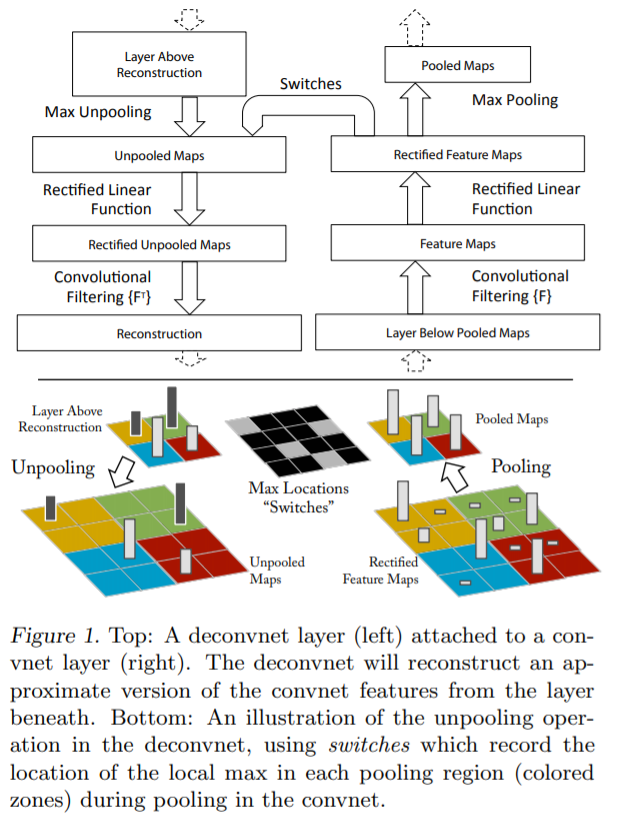

해당 논문은 위에서 설명한 ConvNet 과정을 역으로 해보는 것을 제안했다. 위 그림 Figure 1처럼 ConvNet 과정을 반대로 진행했다. 하지만 생각해보면 **Maxpool은 non-invertible한데 어떻게 할까?**라는 생각이 들 수 있다. 이를 해결하기 위해 **추가적인 변수(switches)** 하나를 더 만들어 maxpool에서 max값이 위치한 픽셀 정보를 저장한다. max값의 위치는 보존이 가능하다. 즉, 완벽한 복원까지는 아니여도 어느정도의 복원은 간으하게끔 한다. Unpooled 부분을 제외하면 나머진 크게 어려울 것이 없다. ReLU의 경우는 그대로 사용하며, 마지막으로 Deconv 연산을 수행해 원래의 이미지로 복원한다.

이 과정을 세분화 시키면 다음과 같다.
1. Unpooling
2. Rectification
3. Filtering

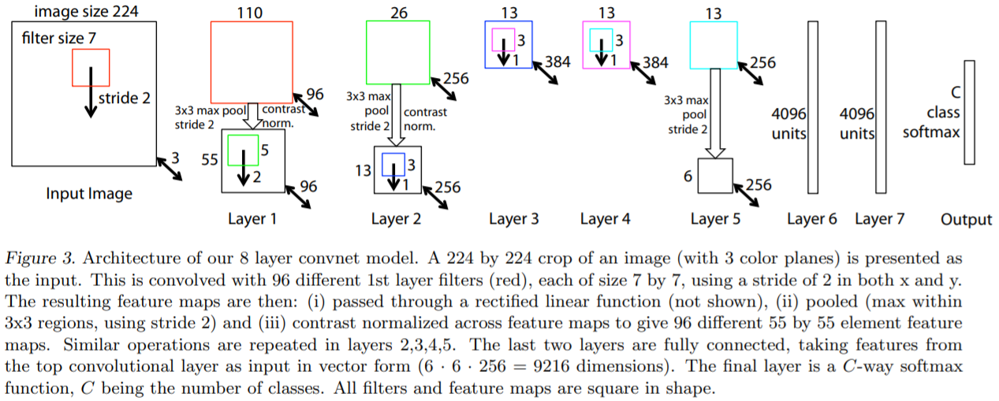

여기서 CNN으로 사용한 모델의 구조는 위의 그림 Figure 3과 같다. 세부사항으론, layer 6. 7에 Dropout(0.5)를 적용했다. 또한 그 외의 hyper-parameter로는 learning rate=0.01, momentum=0.9, initialization of all weights=0.01, biases=0과 같다.

## **결과**

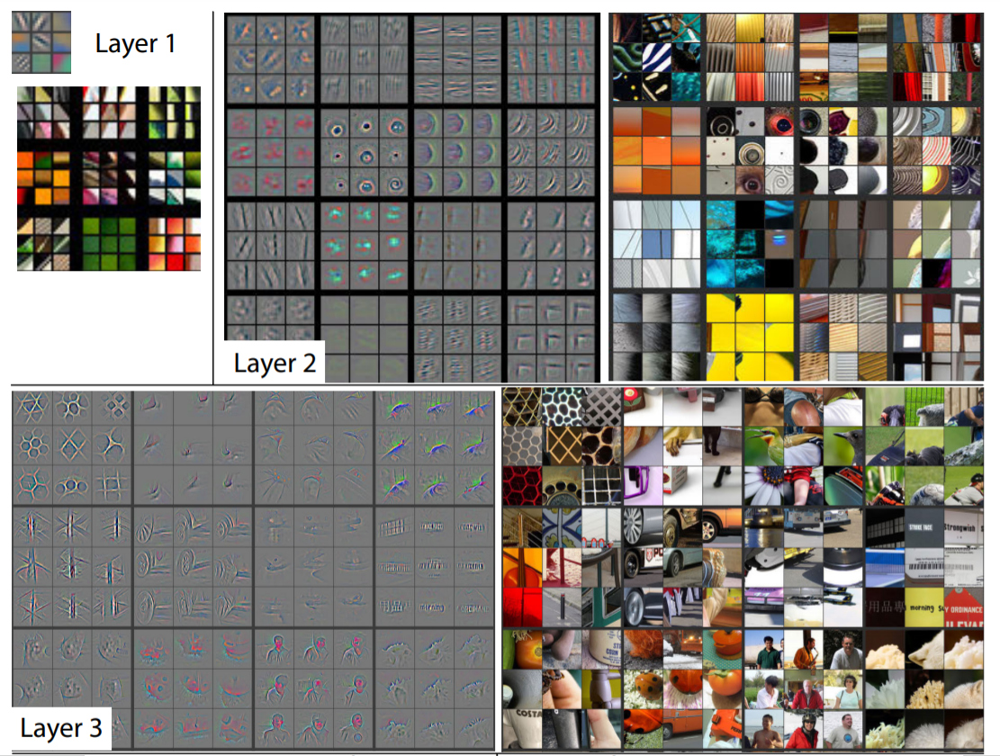

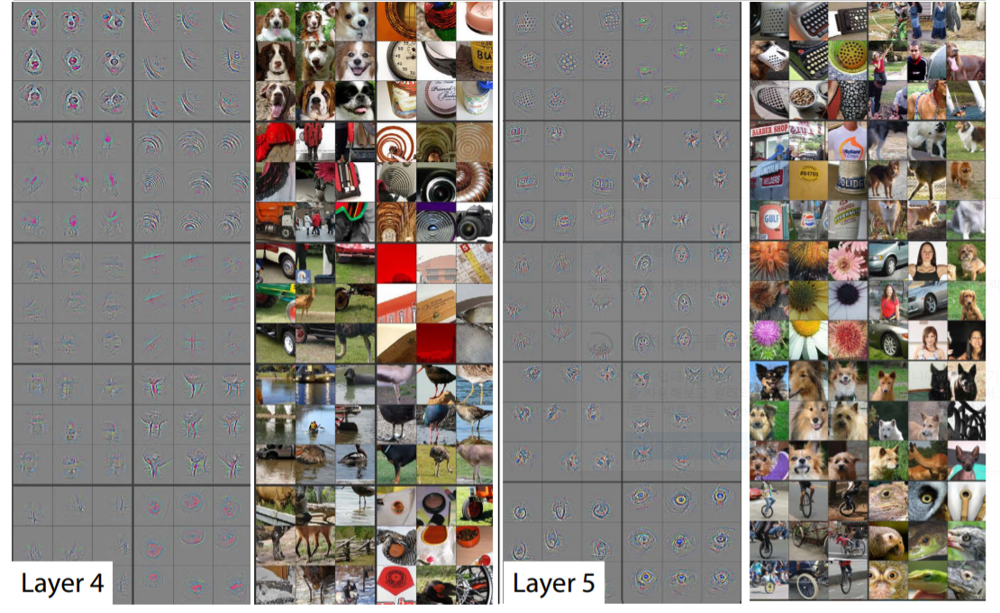

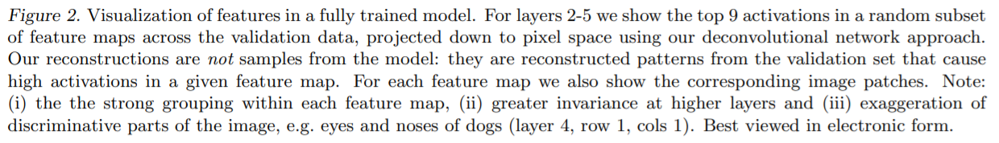

위의 그림 Figure 2는 각 layer별 얻은 feature map에서 가장 강한 특징 9개를 보여주는 동시에 그에 매칭되는 원본 이미지를 보여준다. 이를 통해 각 layer별 학습이 되면서 어떤 feature를 추출하는지 알 수 있다.

- Layer 1,2: edge나 color와 같은 low-level feature를 시각화
- Layer 3: 더 복잡한 invariance(항상성)을 가지거나, texture를 보여주는 feature를 시각화
- Layer4: 사물이나 개체의 일부분을 보여주는 feature를 시각화
- Layer5: 사물이나 개체의 위치 및 자세 변화를 포함하는 전체 모습을 시각화

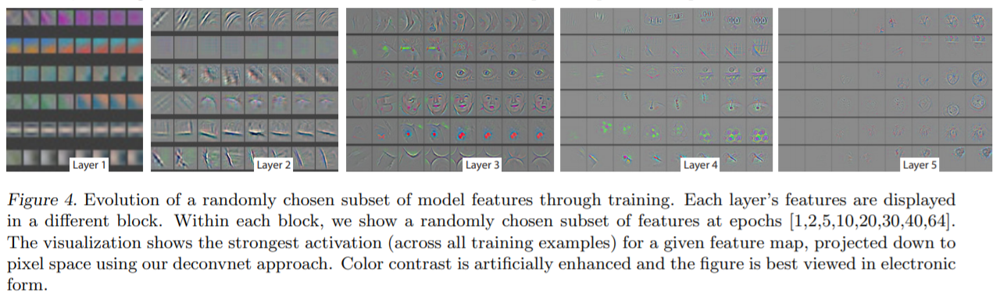

위의 그림 Figure 4를 보면 알 수 있듯이 layer가 깊어지면 깊어질수록 feature를 생성 및 시각화하려면 epoch가 어느정도 진행이 되어야하는 것을 알 수 있다. 40 epochs 이상이 되어야 feature가 선명해졌다고 했는데, 이런 시각화를 통해 적절한 epochs수 또한 결정할 수 있게 된다.

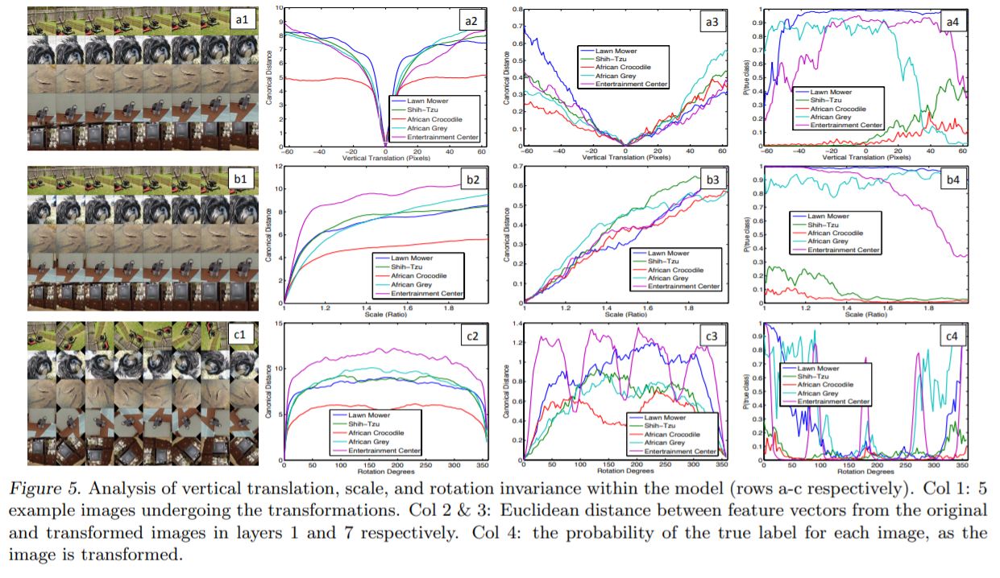

위의 그림 Figure 5를 보면 translation, scale, and rotation에 있어서도 CNN의 특징중 하나인 invariance한 특성을 볼 수 있다. 마지막 layer로 가면 갈수록 translation, scale, and rotation에 영향을 받지 않으며, 원본 이미지가 어떤 것인지 식별할 수 있게 된다. 유클리디안 거리를 원본과 변환된 이미지에 대해 측정한 결과 초반 layer단에서는 거리가 큰 값이 나오지만, 마지막 layer로 갈수록 거리가 작아지는 것을 볼 수 있다.

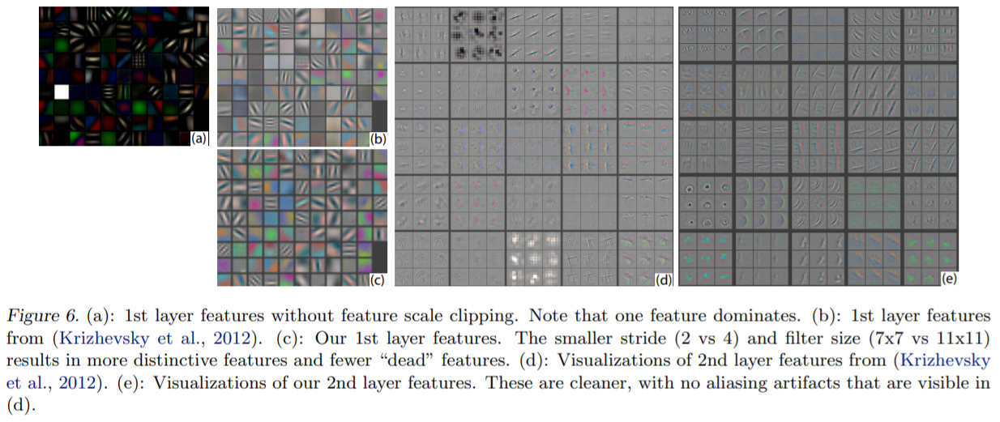

위의 그림 Figure 6은 AlexNet대비 architecture 구조를 변경하여 성능 향상을 시도했는데, layer 1의 filter size, stride를 변경 후 시각화된 feature map을 보면 AlexNet 대비 **feature 수**가 (b), (c) 비교를 보면 알 수 있듯이 **증가**하였다. 뿐만아니라 (d), (e)처럼 **feature들이 선명**해지고, **anti-aliasing** 현상이 없어지는 것 또한 확인이 가능하다.

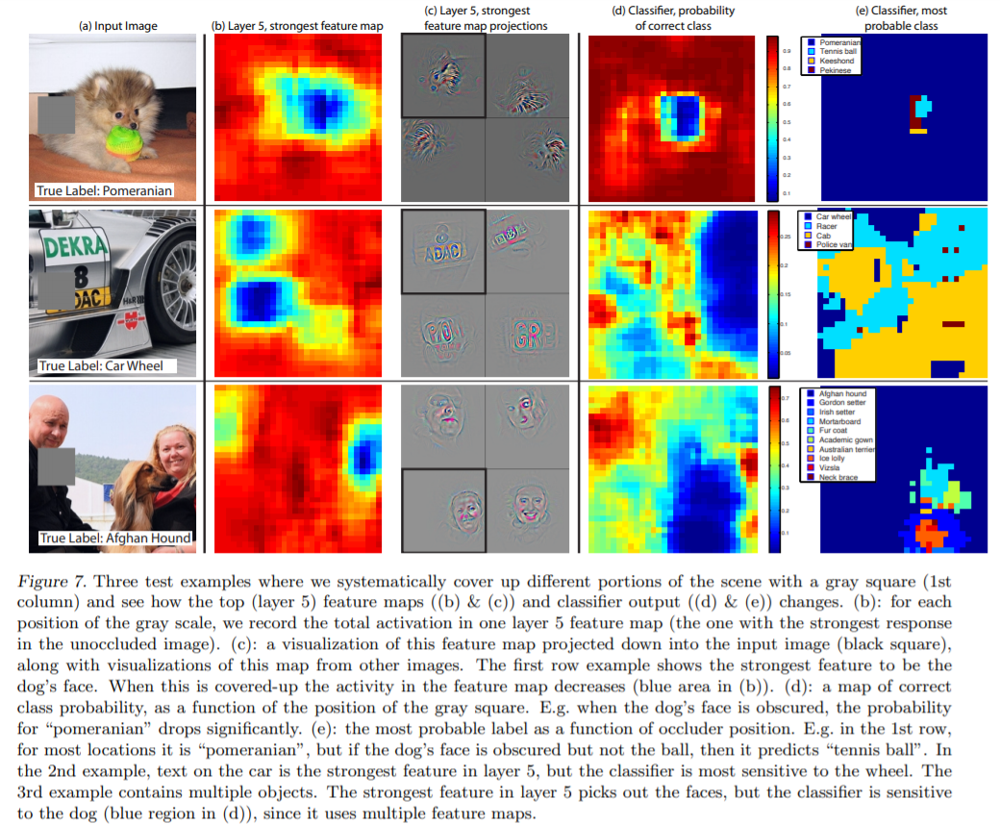

또한. 위의 그림 Figure 7에선 이미지에 있어서 개체의 위치를 인식하는지 확인하는 것 또한 실험을 했는데, 이미지를 대표하는 부분을 흰색 박스로 가리면 인식률이 떨어지는 것을 확인했다.

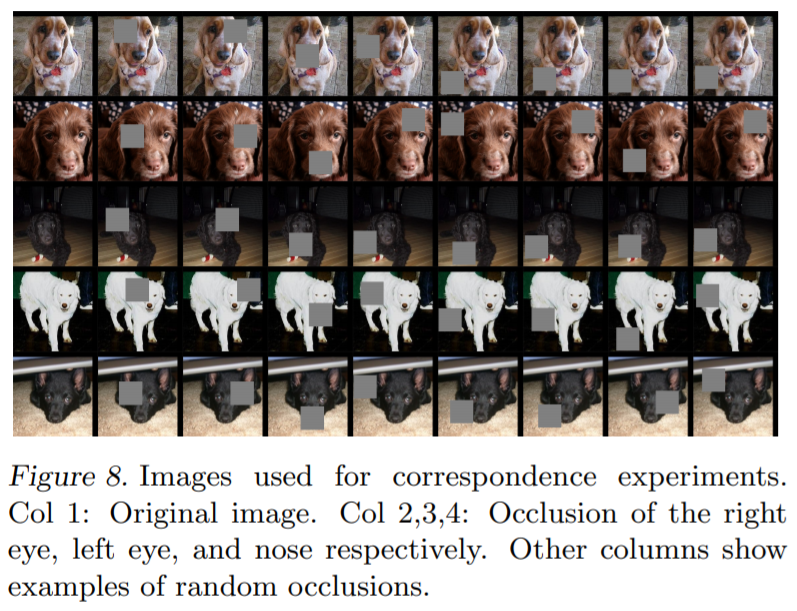

위의 Figure 8과 Table 1이 마지막 실험인데, 해당 실험에서는 다양한 강아지 사진에서 같은 위치를 가린 다음에 비교를 했다. 하지만 큰 차이는 없었는데, 이를 통해 CNN은 다른 사진에 있는 같은 물체의 정보를 제대로 인식하고 있다는 것을 알 수 있다. 